<div style="text-align: center;">
  <h1>TA145 - Redes Neuronales y Aprendizaje Profundo</h1>
  <h2>Trabajo Práctico 3: Red de Kohonen</h2>
</div>

---
---

<div style="text-align: left;">
  <h3><b>Introducción</b></h3>
</div>

&ensp; En el presente trabajo, se analizan las Redes de Kohonen como un modelo fundamental de aprendizaje no supervisado, con el fin de comprender su capacidad para proyectar espacios de alta dimensión en estructuras topológicas de menor dimensión, preservando las relaciones de vecindad originales. Para ello, se estudia el modelado de la red y su dinámica de entrenamiento, basada en los principios de competencia neuronal y cooperación vecinal, métodos que permiten la formación de mapas ordenados que reflejan la densidad de probabilidad de los datos de entrada. En función de esto, se llevan a cabo ejercicios que abarcan tres aplicaciones distintas del modelo: primero, se evalúa la capacidad de adaptación de la red aprendiendo distribuciones uniformes sobre diversas figuras geométricas planas; segundo, se adapta la arquitectura a una topología unidimensional para resolver el *Travelling Salesman Problem* (TSP); y finalmente, se aplica el modelo a la reducción de dimensionalidad y detección de *clusters* en un conjunto de datos de alta dimensión, utilizando la *U-Matrix* (*Unified Distance Matrix*) como herramienta de validación visual.

---
---

<div style="text-align: left;">
  <h3><b>Desarrollo</b></h3>
</div>

<div style="text-align: left;">
  <h3><b>Librerías utilizadas</b></h3>
</div>

&ensp; El desarrollo del presente trabajo se basa en la utilización de librerías fundamentales de $\texttt{Python}$ orientadas al cálculo científico y al análisis de datos. Se emplea $\texttt{NumPy}$ para el procesamiento numérico y la manipulación eficiente de estructuras matriciales, aspectos esenciales para el funcionamiento del algoritmo. La representación visual de los resultados, se realiza mediante $\texttt{Matplotlib}$. Complementariamente, se integran herramientas auxiliares como $\texttt{Pandas}$ y $\texttt{Typing}$, que aportan organización y claridad a la estructura del código implementado.

In [29]:
# --- Basic Imports ---
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import HTML, display
from typing import Tuple

---

<div style="text-align: left;"><h3><b>Base teórica - Red de Kohonen</b></h3></div>

<div style="text-align: left;"> <h4><b>Arquitectura general</b></h4> </div>

&ensp; Las Redes de Kohonen o mapas auto-organizados (SOM del inglés *Self Organizing Maps*), propuestas por Teuvo Kohonen en $1982$, son un tipo de red neuronal no supervisada que proyecta datos de un espacio de entrada de alta dimensión a un mapa discreto de menor dimensión (generalmente bidimensional), preservando las relaciones topológicas originales.  

&ensp; La arquitectura se compone de dos capas principales totalmente conectadas:

1. **Capa de entrada:** Formada por $n$ neuronas, donde $n$ es la dimensión del vector de datos de entrada $\mathbf{x} = [x_1, x_2, \dots, x_n]^\top$. Esta capa se encarga de recibir y transmitir las señales de entrada a todas las neuronas de la capa siguiente. No realiza ningún procesamiento.

2. **Capa de salida o competitiva:** Consiste en un conjunto de $M$ neuronas organizadas en una estructura topológica definida, típicamente una rejilla bidimensional o unidimensional. Cada neurona $j$ en esta capa tiene asociado un vector de pesos $\mathbf{w}_j = [w_{j1}, w_{j2}, \dots, w_{jn}]^\top$ que vive en el mismo espacio $n$-dimensional que los datos de entrada.

<center>
<figure> <img src="https://cdn.jsdelivr.net/gh/felipeperassi/Neural-Networks@30a72f62e6b9e60e2f2dbfb1e59fbd5a4eee465a/Kohonen-Networks/ReportImages/SOM.png" alt="Estructura de un SOM" width="700"> <figcaption><i>Figura 2.</i> Arquitectura general de un SOM. Cada nodo de la capa de entrada está conectado a todas las neuronas del mapa de salida (rejilla 2D). Los pesos sinápticos conectan el espacio de entrada con el espacio topológico.</figcaption> </figure>
</center>

&ensp; Es crucial distinguir entre la ubicación topológica de una neurona (su fila y columna en la rejilla, coordenadas fijas y discretas) y su ubicación en el espacio de características determinada por su vector de pesos $\mathbf{w}_j \in \mathbb{R}^n$, que cambia durante el entrenamiento.

&ensp;

<div style="text-align: left;"><h4><b>Entrenamiento</b></h4></div>

&ensp; El objetivo del entrenamiento es que los vectores de pesos $\mathbf{w}_j$ se distribuyan en el espacio $\mathbb{R}^n$ aproximando la densidad de probabilidad de los datos de entrada. El proceso es iterativo:

1. **Inicialización:** Antes de comenzar las iteraciones, es necesario establecer los valores iniciales de los vectores de pesos $\mathbf{w}_j(0)$ para todas las neuronas de la red. Habitualmente, estos se inicializan con valores aleatorios pequeños o tomando muestras aleatorias del propio conjunto de datos de entrada. Esto sitúa a las neuronas en posiciones arbitrarias dentro del espacio de entrada, desde donde comienzan a organizarse.

2. **Competencia:** La red calcula la similitud entre $\mathbf{x}(t)$ y el vector de pesos $\mathbf{w}_j$ de todas las neuronas del mapa. La neurona ganadora o *Best Matching Unit* (BMU), denotada como $c$, es la que tiene la menor distancia (generalmente Euclidiana):

$$c = \arg \min_{j} |\mathbf{x}(t) - \mathbf{w}_j(t)|$$

3. **Cooperación:** La neurona ganadora $c$ determina una vecindad espacial en la rejilla topológica. Las neuronas que se encuentren dentro de esta vecindad serán excitadas junto con la ganadora. El grado de participación de una neurona $j$ depende de su distancia lateral a la ganadora en la rejilla, modelado por una función de vecindad $h_{c,j}(t)$: $$h_{c,j}(t) = \exp \left( -\frac{d_{c,j}^2}{2\sigma^2(t)} \right)$$ Donde $\sigma(t)$ es el radio de vecindad, que disminuye con el tiempo. Este mecanismo es el responsable de que neuronas adyacentes en el mapa terminen respondiendo a características similares, preservando así la topología.

4. **Actualización de pesos:** En esta etapa final del ciclo, se ajustan los vectores de pesos de todas las neuronas activadas (la ganadora y sus vecinas) para acercarlos al vector de entrada $\mathbf{x}(t)$. La regla de aprendizaje es:$$\mathbf{w}_j(t+1) = \mathbf{w}_j(t) + \eta(t) \cdot h_{c,j}(t) \cdot [\mathbf{x}(t) - \mathbf{w}_j(t)]$$ El término $[\mathbf{x}(t) - \mathbf{w}_j(t)]$ representa la diferencia entre el dato y el peso actual. Al sumar una fracción de esta diferencia (modulada por la tasa de aprendizaje $\eta(t)$ y la vecindad $h_{c,j}$), el vector de pesos rota y se desplaza hacia el dato de entrada, reduciendo el error para futuras presentaciones similares.

---

<div style="text-align: left;">
  <h4><b>Ejercicio 1</b></h4>
</div>

**Construya una red de Kohonen de $2$ entradas que aprenda una distribución uniforme dentro del círculo unitario. Mostrar el mapa de preservación de topología. Probar con distribuciones uniformes dentro de otras figuras geométricas.**

&ensp;

&ensp; Una vez definidos los fundamentos teóricos de la Red de Kohonen, se procede a su implementación computacional. La clase $\texttt{GridKohonenNetwork}$ modela la arquitectura y dinámica de la red, integrando la inicialización, la búsqueda competitiva y la regla de actualización cooperativa. A continuación se describen los métodos principales que componen esta estructura.

- $\texttt{\_\_init\_\_}$: Establece la topología de la capa de salida definiendo las dimensiones de la rejilla con el parámetro `network_size`. Valida que la estructura solicitada sea bidimensional y deja el tensor de pesos `self.weights` sin inicializar, reflejando el estado previo a la presentación de cualquier dato.

- $\texttt{train}$: Realiza el algoritmo de aprendizaje completo. Comienza inicializando los pesos mediante $\texttt{\_\_initialize\_weights}$ para situar las neuronas en el espacio de entrada. Posteriormente, ejecuta el ciclo iterativo de entrenamiento por el número de *epochs* especificado. En cada iteración:

  1. Actualiza la tasa de aprendizaje $\eta(t)$ y el radio de vecindad $\sigma(t)$ mediante $\texttt{\_\_params\_decay}$.

  2. Para cada patrón de entrada $\mathbf{x}$, identifica la neurona ganadora $c$ usando $\texttt{\_\_best\_matching\_unit}$.

  3. Calcula la influencia vecinal $h_{c,j}(t)$ basada en la distancia topológica en la rejilla y el radio actual.

  4. Ejecuta la regla de adaptación:
  $$\mathbf{w}_j \leftarrow \mathbf{w}_j + \eta(t) \cdot h_{c,j}(t) \cdot (\mathbf{x} - \mathbf{w}_j)$$
  
  El proceso incluye un criterio de parada temprana si el radio de vecindad decae por debajo de $0.5$, momento en el cual la influencia lateral se vuelve despreciable.
  
- $\texttt{get\_map}$: Proporciona acceso al estado final de la red, devolviendo el tensor de pesos $\mathbf{w}$. Este mapa representa la proyección discretizada del espacio de entrada aprendida por el modelo.

<!-- - $\texttt{unified\_distance\_matrix}$: Implementa el cálculo de la U-Matrix de manera vectorizada para evaluar la estructura de clusters. Calcula las distancias Euclidianas entre los pesos de neuronas adyacentes tanto vertical como horizontalmente en la rejilla. Posteriormente, promedia estas distancias para cada nodo, generando una matriz donde los valores altos indican fronteras (discontinuidades en el espacio de características) y los valores bajos indican clusters (continuidad topológica). -->

- $\texttt{\_\_initialize\_weights}$: Define la posición inicial de las neuronas $\mathbf{w}_j(0)$. Utiliza una estrategia de inicialización basada en muestras, seleccionando aleatoriamente puntos del conjunto de datos de entrada y añadiendo un ligero ruido gaussiano modelado como $\mathcal{N}(0, 0.01)$. Esto asegura que la red comience su adaptación en una región relevante del espacio $\mathbb{R}^n$.

- $\texttt{\_\_best\_matching\_unit}$: Resuelve la fase de competencia del algoritmo. Dado un vector de entrada $\mathbf{x}$, calcula la distancia Euclidiana contra todos los vectores de pesos $\mathbf{w}_j$ de la red y retorna las coordenadas $(i, j)$ de la neurona que minimiza dicha distancia:

$$c = \arg \min_{j} \|\mathbf{x} - \mathbf{w}_j\|$$

- $\texttt{\_\_params\_decay}$: Modela el enfriamiento del sistema. Reduce la tasa de aprendizaje $\eta$ y el radio de vecindad $\sigma$ siguiendo funciones de decaimiento exponencial. A diferencia de la implementación estándar, se calcula una constante de tiempo específica $\tau$ para el radio, diseñada para asegurar que este alcance un valor objetivo mínimo (fijado en $0.1$) al finalizar el entrenamiento ($t=T$). Las ecuaciones resultantes son:$$\eta(t) = \eta_0 \cdot e^{-t/T}, \quad \sigma(t) = \sigma_0 \cdot e^{-t/\tau} \quad \text{con} \quad \tau = \frac{T}{\ln(\sigma_0 / 0.1)}$$Esto garantiza que, independientemente del radio inicial, la red transite correctamente desde una fase de ordenamiento global hacia una fase de ajuste fino local al final de las iteraciones.

In [30]:
class GridKohonenNetwork():
    
    def __init__(self, network_size) -> None:
        if len(network_size) != 2:
            raise ValueError("network_size must be a tuple of two integers.")

        self.network_size = network_size
        self.weights = None

    def train(self, input, learning_rate, radio, max_epochs=100) -> None:
        """
        Train the Kohonen network using the given input values.
        """
        if input is None or len(input) == 0:
            raise ValueError("Input data cannot be None or empty.")

        if learning_rate <= 0 or learning_rate > 1:
            raise ValueError("Learning rate must be in the range (0, 1].")

        grid_coords = np.indices(self.network_size).transpose(1, 2, 0)
        self.weights = self.__initialize_weights(input)
        
        epoch = 0
        early_stop = False
        while epoch < max_epochs and not early_stop:
            new_lr, new_rad = self.__params_decay(learning_rate, radio, epoch, max_epochs)
            if new_rad < 0.5:
                early_stop = True
            
            shuffled_idx = np.random.permutation(len(input))
            shuffled_input = input[shuffled_idx]  

            for input_sample in shuffled_input:
                bmu_index = self.__best_matching_unit(input_sample)    
                distances = np.linalg.norm(grid_coords - bmu_index, axis=2) ** 2

                neighbor_influence = np.exp(-distances / (2 * (new_rad ** 2)))[:, :, np.newaxis]
                self.weights += new_lr * neighbor_influence * (input_sample - self.weights)
            
            epoch += 1

    def get_map(self) -> np.ndarray:
        """
        Returns the weight map of the Kohonen network.
        """
        return self.weights

    def unified_distance_matrix(self) -> np.ndarray:
        """
        Calculate the Unified Distance Matrix (U-Matrix) of the Kohonen network.
        """
        rows, cols, _ = self.weights.shape
        
        u_matrix = np.zeros((rows, cols))
        counts = np.zeros((rows, cols))
        
        diff_v = np.linalg.norm(self.weights[:-1] - self.weights[1:], axis=2)
        diff_h = np.linalg.norm(self.weights[:, :-1] - self.weights[:, 1:], axis=2)
        
        u_matrix[:-1, :] += diff_v
        counts[:-1, :] += 1
        
        u_matrix[1:, :] += diff_v
        counts[1:, :] += 1
        
        u_matrix[:, :-1] += diff_h
        counts[:, :-1] += 1
        
        u_matrix[:, 1:] += diff_h
        counts[:, 1:] += 1
        
        return u_matrix / counts
    
    # --- Auxiliary Methods ---

    def __initialize_weights(self, input) -> np.ndarray:
        """
        Initialize the weights of the Kohonen network.
        """
        n_neurons = self.network_size[0] * self.network_size[1]
        n_samples, n_features = input.shape
        replace = n_samples < n_neurons
        
        idx_w = np.random.choice(n_samples, n_neurons, replace=replace)
        weights = input[idx_w] + np.random.normal(0, 0.01, (n_neurons, n_features))
        
        return weights.reshape(*self.network_size, n_features)

    def __best_matching_unit(self, input_sample) -> Tuple[int, int]:
        """
        Find the Best Matching Unit (BMU) for a given input sample.
        """
        distances = np.linalg.norm(self.weights - input_sample, axis=2)
        bmu_index = np.unravel_index(np.argmin(distances, axis=None), distances.shape)
        return bmu_index

    def __params_decay(self, learning_rate, radio, epoch, max_epochs) -> Tuple[float, float]:
        """
        Decay learning rate and neighborhood radius over epochs.
        """
        tau = max_epochs / np.log(radio / 0.1)
        return [learning_rate * np.exp(-epoch / max_epochs), radio * np.exp(-epoch / tau)]

&ensp; Para evaluar la capacidad de la red de Kohonen de adaptarse a diferentes topologías, se implementó la función $\texttt{generate\_geometric\_data}$. Este método es responsable de generar conjuntos de datos sintéticos bidimensionales $\mathbf{x} \in \mathbb{R}^2$ distribuidos uniformemente sobre superficies geométricas específicas. La función recibe como parámetros el nombre de la figura deseada `figure_name` y la cantidad de muestras a generar `n_samples`, retornando una matriz de coordenadas que sirve como conjunto de entrenamiento para la red.  

&ensp; El algoritmo implementa estrategias de muestreo particulares para cada geometría soportada con el fin de garantizar una densidad de probabilidad uniforme en la superficie:

- **Círculo:** Se utilizan coordenadas polares para la generación. El ángulo $\theta$ se genera a partir de muestras uniformes en el intervalo $[0, 2\pi)$. Para el radio $r$, se aplica la transformación $r = \sqrt{u}$, donde $u \sim \mathcal{U}(0, 1)$. Esta raíz cuadrada es fundamental para compensar el incremento del área diferencial con la distancia al centro, asegurando que los puntos no se concentren en el origen y se distribuyan homogéneamente en el disco unitario. Finalmente, las coordenadas se transforman al sistema cartesiano mediante $x = r \cos(\theta)$ e $y = r \sin(\theta)$.

- **Cuadrado:** La generación es directa, generando muestras de las coordenadas $x$ e $y$ de manera independiente a partir de una distribución uniforme en el intervalo $[-1, 1]$. Esto resulta en una nube de puntos que cubre el área definida por el cuadrado centrado en el origen con lados de longitud $2$.

- **Triángulo:** Se emplea un método de muestreo por rechazo. Se generan pares de coordenadas $(x, y)$ uniformemente en el cuadrado unitario $[0, 1] \times [0, 1]$. Posteriormente, se seleccionan únicamente aquellos puntos que satisfacen la condición $y \le 1 - x$. Geométricamente, esto corresponde a retener los puntos que caen bajo la diagonal principal del primer cuadrante, formando un triángulo rectángulo isósceles con vértices en $(0,0)$, $(1,0)$ y $(0,1)$.

In [31]:
def generate_geometric_data(figure_name, n_samples) -> np.ndarray:
    """
    Generates geometric data based on the specified figure.
    Supported figures: 'circle', 'square', 'triangle'
    """
    supported_figures = ['circle', 'square', 'triangle']
    if figure_name not in supported_figures:
        raise ValueError(f"Unsupported figure: {figure_name}. Supported figures are: {supported_figures}")

    if figure_name == 'circle':
        theta, r = np.random.uniform(0, 2 * np.pi, n_samples), np.sqrt(np.random.uniform(0, 1, n_samples))
        x, y = r * np.cos(theta), r * np.sin(theta)
        return np.column_stack((x, y))
    
    elif figure_name == 'square':
        x, y = np.random.uniform(-1, 1, n_samples), np.random.uniform(-1, 1, n_samples)
        return np.column_stack((x, y))
    
    elif figure_name == 'triangle':
        points = []
        while len(points) < n_samples:
            x, y = np.random.uniform(0, 1, 2)
            if y <= 1 - x:
                points.append((x, y))
        return np.array(points)

&ensp; Luego de haber implementado la función que genera las muestras que se desean aprender con la Red de Kohonen, se desarrollan dos funciones complementarias para la visualización de la red. La función $\texttt{plot\_kohonen\_map}$ se encarga de graficar el mapa de pesos de la red y los datos en un eje específico. Por otro lado, $\texttt{plot\_map\_loop}$ gestiona el bucle sobre las distintas configuraciones de parámetros (figuras, tamaños, radios y tasas de aprendizaje), entrenando las redes y organizando la grilla de gráficos para llamar a la función de visualización.

In [32]:
def plot_kohonen_map(ax, kohonen_network, data, title="Kohonen Network Weight Map") -> None:
    """
    Plots the weight map of the Kohonen network.
    """
    weights = kohonen_network.get_map()
    rows, cols, _ = weights.shape
    
    ax.scatter(data[:, 0], data[:, 1], c='#6e9987', marker='.', label='Input Data', zorder=1)

    ax.scatter(weights[:, :, 0], weights[:, :, 1], c='#27191c', marker='o', label='Neurons', zorder=3)
    for row in range(rows): ax.plot(weights[row, :, 0], weights[row, :, 1], c='#27191c', zorder=2)
    for col in range(cols): ax.plot(weights[:, col, 0], weights[:, col, 1], c='#27191c', zorder=2)

    ax.set_title(title)
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5, zorder=0)

def plot_map_loop(geometric_figures, network_sizes, radios, learning_rates, max_epochs=100) -> None:
    """
    Plots Kohonen network weight maps for various configurations.
    """
    for geo_fig in geometric_figures:
        data = generate_geometric_data(geo_fig, 1000)
        
        for size in network_sizes:
            fig, axes = plt.subplots(len(radios), len(learning_rates), figsize=(16, 10), squeeze=False)
            fig.suptitle(f"Figure: {geo_fig.capitalize()} | Network Size: {size}", fontsize=16, fontweight='bold')
            
            for i, r in enumerate(radios):
                for j, lr in enumerate(learning_rates):
                    KN = GridKohonenNetwork(network_size=size)
                    KN.train(data, learning_rate=lr, radio=r, max_epochs=max_epochs)
                    plot_kohonen_map(axes[i, j], KN, data, title=f"R={r}, LR={lr}")
            
            plt.tight_layout(rect=[0, 0.03, 1, 0.98])
            plt.show()

&ensp; En base a lo desarrollado, se utilizan diferentes configuraciones para evaluar el comportamiento del modelo. Se establecen las listas de hiperparámetros que combinan las distintas geometrías de entrada, las dimensiones de la rejilla neuronal, los radios iniciales de vecindad y las tasas de aprendizaje. Con esta configuración, se procede a ejecutar la rutina de entrenamiento y visualización de cada configuración.

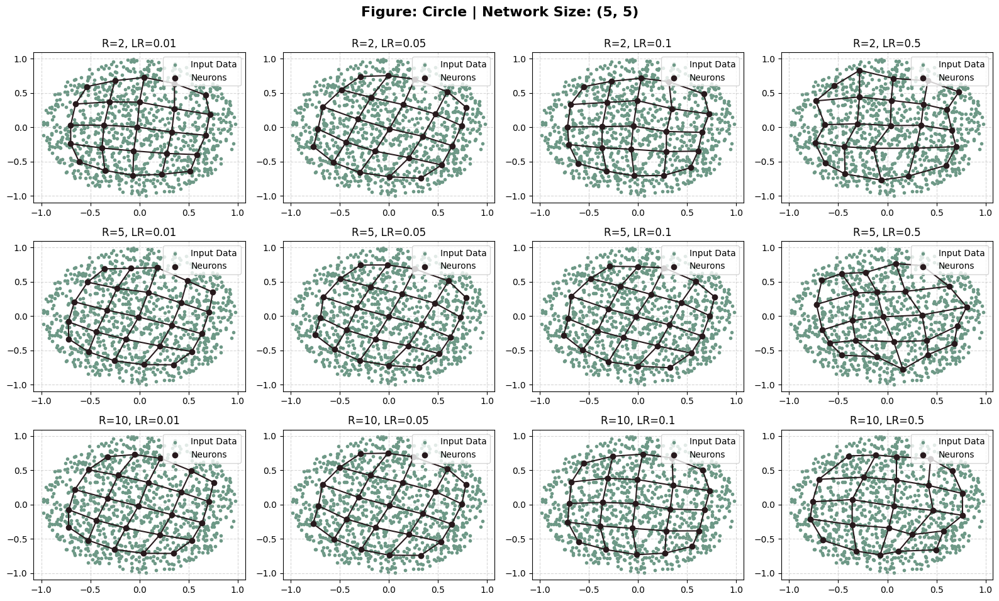

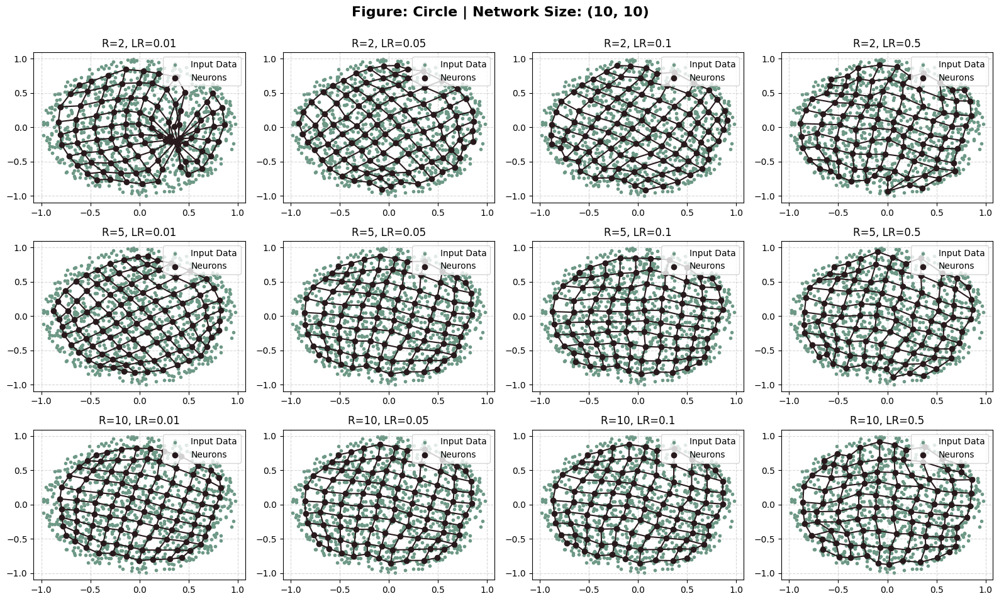

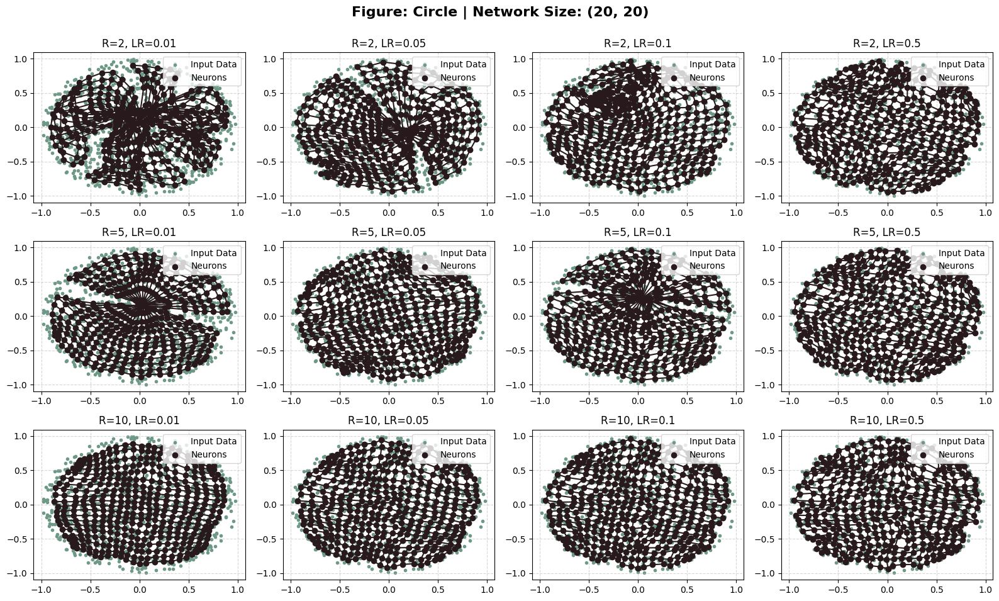

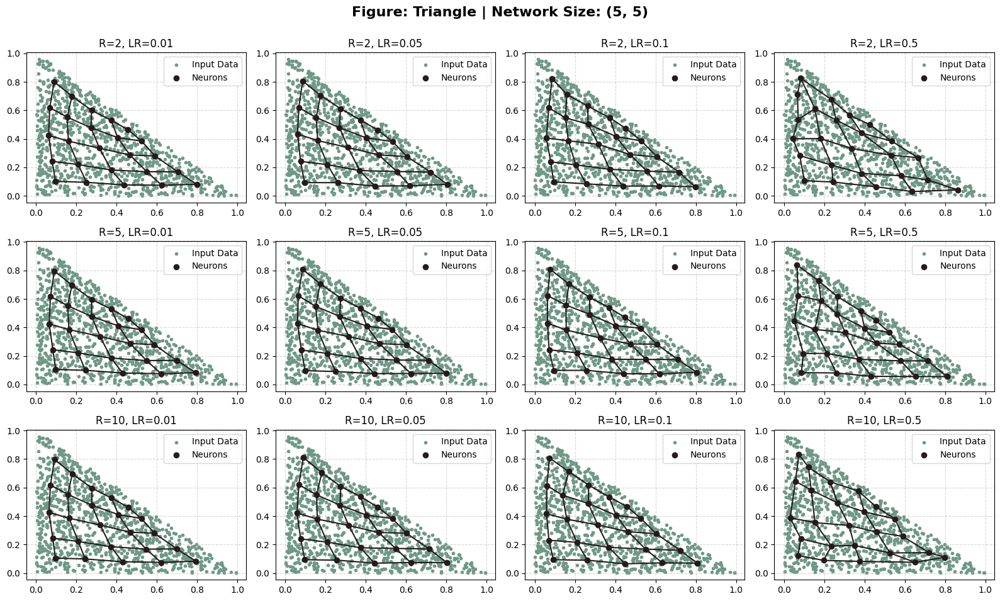

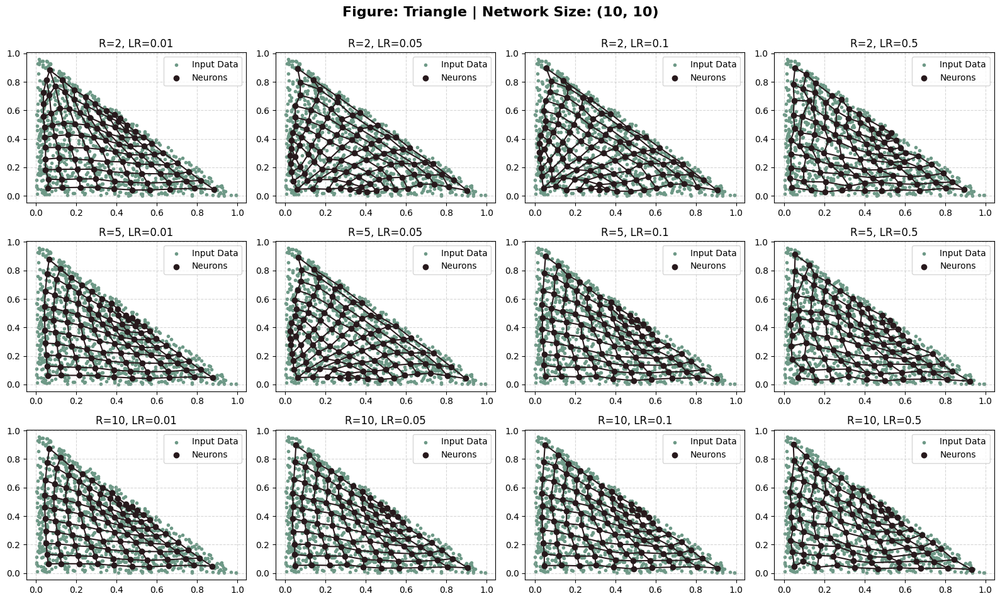

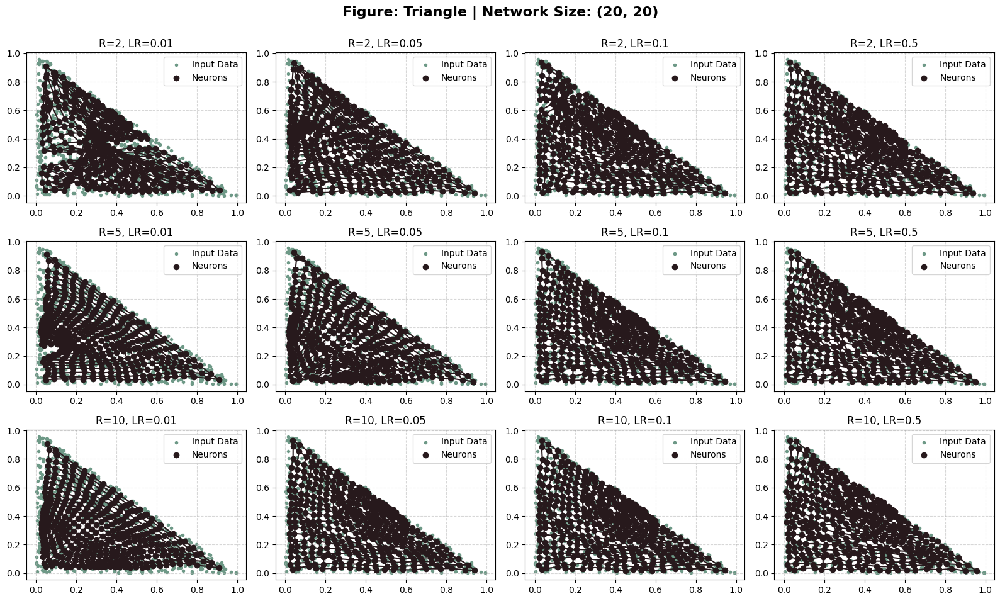

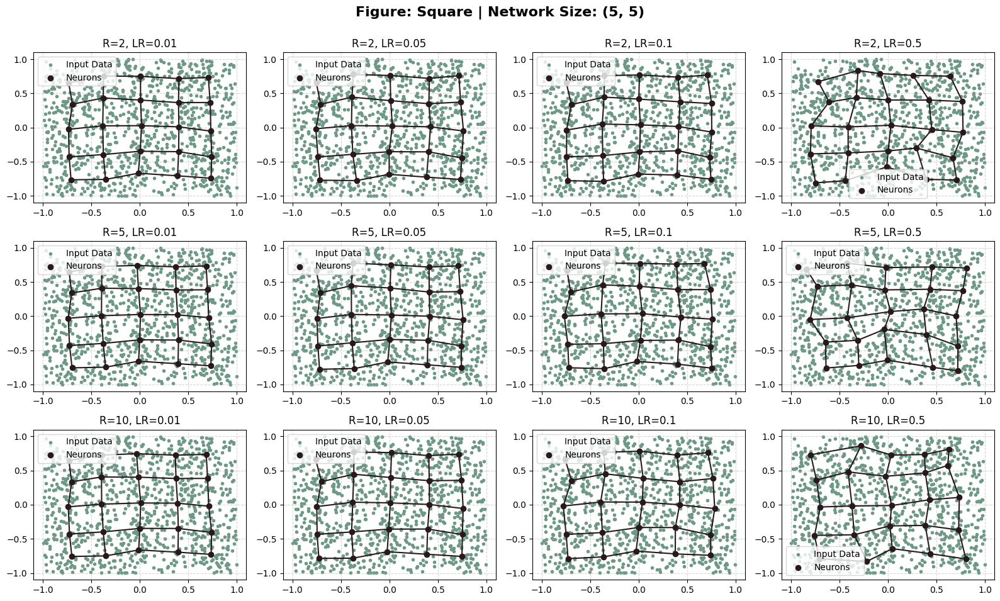

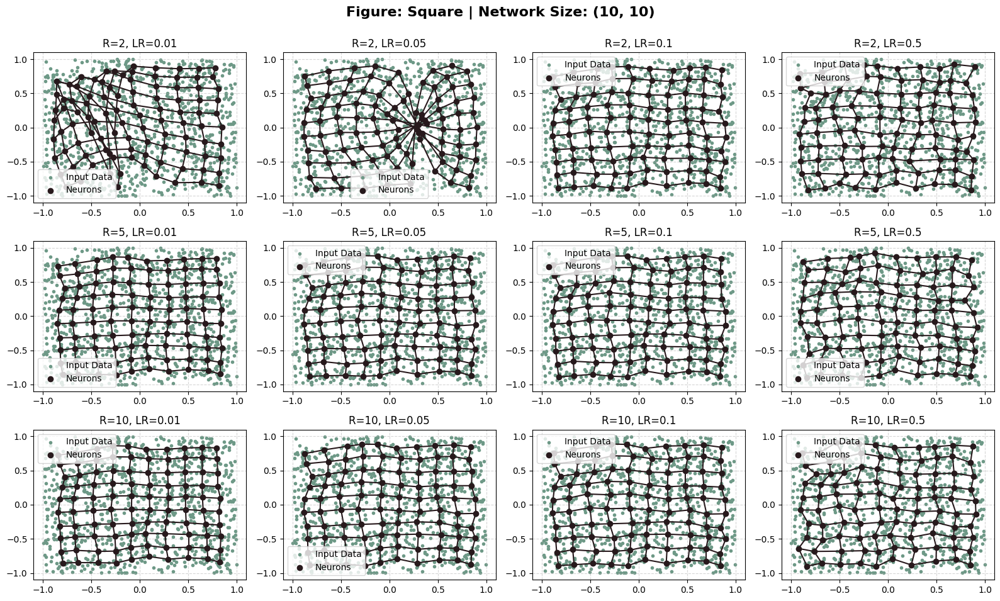

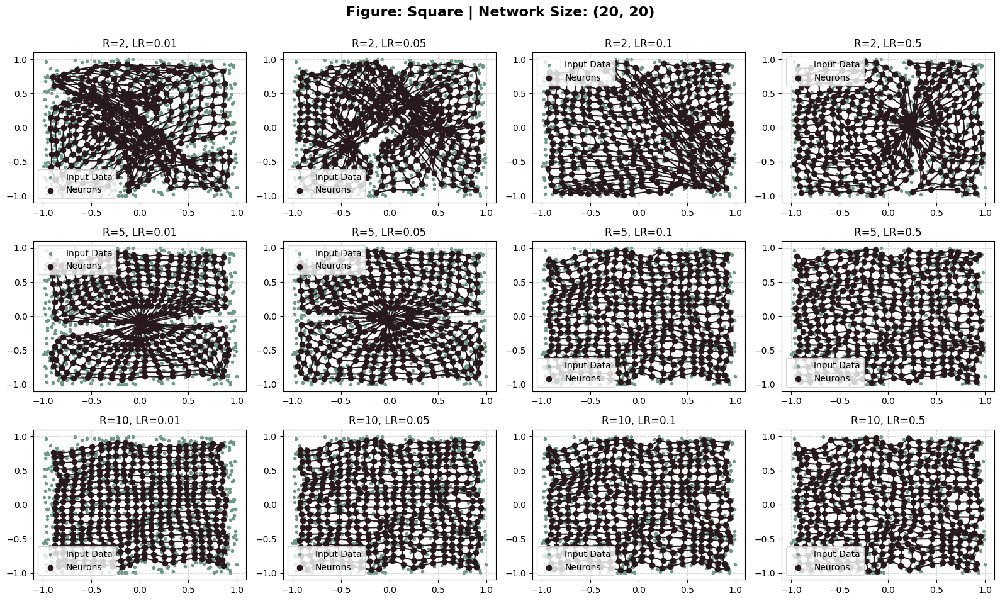

In [33]:
geometric_figures = ['circle', 'triangle', 'square']
network_sizes = [(5, 5), (10, 10), (20, 20)]
radios = [2, 5, 10]       
learning_rates = [0.01, 0.05, 0.1, 0.5] 

plot_map_loop(geometric_figures, network_sizes, radios, learning_rates)

&ensp; Para evaluar el comportamiento de la red, se generaron $1000$ muestras con distribución uniforme para cada figura geométrica. Los gráficos presentados corresponden a las primeras $100$ *epochs* de entrenamiento, un corte temprano que permite analizar la velocidad de convergencia y la capacidad de despliegue inicial de las distintas configuraciones. Al observar el dimensionamiento de la red, la topología de $20\times20$ ($400$ neuronas) presenta una cantidad excesiva de nodos respecto al número de muestras y *epochs* procesadas. Esto provoca que muchas neuronas permanezcan agrupadas o muy próximas entre sí, generando información redundante. Este fenómeno ocurre porque, con solo $100$ *epochs*, gran parte de las neuronas no han sido seleccionadas como ganadoras la cantidad de veces suficiente para desplazarse y distribuirse homogéneamente por el espacio; la red posee una capacidad de representación muy alta, pero requiere un tiempo de entrenamiento considerablemente mayor para desplegarse por completo sin solapamientos. En contraposición, la red de $5\times5$ ($25$ neuronas) resulta insuficiente para capturar la topología de las $1000$ muestras, convergiendo rápidamente, pero ofreciendo una representación de baja resolución que pierde los detalles de la distribución de las muestras.  

&ensp; En este contexto, la configuración de tamaño $10\times10$ demuestra ser la más eficiente, logrando el equilibrio óptimo entre resolución y velocidad de adaptación. Se observa que esta topología converge rápidamente hacia la distribución espacial de las tres formas evaluadas, capturando correctamente la forma de los datos. Un aspecto destacable de este dimensionamiento es su invarianza frente al cambio de la tasa de aprendizaje, ya que, no se aprecian diferencias significativas en la malla de la Red de Kohonen al modificar $\eta$ y $\sigma$. Las ligeras discrepancias que pueden visualizarse entre configuraciones no se deben a una sensibilidad crítica del parámetro, sino al hecho de que, dada la cantidad limitada de *epochs*, el proceso de actualización aún no ha alcanzado a refinar la posición final de la totalidad de los valores, aunque la distribución global ya sea la correcta.

&ensp; Por otro lado, cabe destacar que si bien con las configuraciones óptimas la forma es clara, se observa que a la red le cuesta alcanzar los bordes exactos de la figura. Esto se debe a un efecto de borde propio de las Redes de Kohonen: para las neuronas que se acercan a la frontera, no existen datos fuera de la figura que las atraigan hacia el exterior. Por el contrario, la vecindad con otras neuronas que están situadas hacia el interior y la atracción constante de los datos internos generan una fuerza que mantiene los pesos ligeramente sesgados hacia adentro, impidiendo una cobertura perfecta del perímetro a menos que el radio de vecindad tienda a cero.

---

<div style="text-align: left;"><h3><b>Base teórica - <i>Traveling Salesman Problem</i></b></h3>

</div><div style="text-align: left;"><h4><b>Definición del problema</b></h4></div>

&ensp; El problema del viajante de comercio (TSP, por sus siglas en inglés *Traveling Salesman Problem*) es uno de los enunciados más estudiados en optimización combinatoria. El problema es simple: dada una lista de ciudades y las distancias entre cada par de ellas, ¿cuál es la ruta más corta posible que visita cada ciudad exactamente una vez y regresa a la ciudad de origen?  

&ensp; Matemáticamente, el objetivo es encontrar una combinación de las ciudades que minimice la distancia total del recorrido. A pesar de su sencillez conceptual, es un problema *NP-Hard*, lo que significa que no existe un algoritmo conocido que pueda encontrar la solución exacta en tiempo polinómico para un número arbitrariamente grande de ciudades. A medida que aumenta el número de ciudades $N$, la cantidad de rutas posibles crece factorialmente $N!$, haciendo inviable la búsqueda por fuerza bruta. Por ello, se recurre a métodos heurísticos o aproximados, como las redes neuronales.

&ensp; 

<div style="text-align: left;"><h4><b>Anillo vs. Grilla</b></h4></div>

&ensp; Para aplicar una Red de Kohonen al TSP, es necesario modificar la estructura topológica clásica. La diferencia fundamental radica en cómo se organizan las neuronas en la capa de salida para representar la solución deseada.

- **Grilla:** Las neuronas se disponen en una matriz bidimensional donde cada nodo $(i, j)$ interactúa con $4$ vecinos directos (Norte, Sur, Este, Oeste). Su propósito es aproximar una variedad bidimensional (una superficie o plano) que se ajuste a la distribución de los datos.

- **Anillo:** Las neuronas se disponen en una secuencia lineal cerrada. Se indexan como $n_1, n_2, \dots, n_M$, y la vecindad es periódica: la última neurona $n_M$ es vecina inmediata de la primera $n_1$. Cada unidad tiene exactamente $2$ vecinos. Su propósito es aproximar una variedad unidimensional cerrada (una curva).

&ensp; La superioridad del anillo frente a la grilla para el TSP radica fundamentalmente en que su forma unidimensional coincide con el objetivo del problema: encontrar una secuencia única y ordenada de visitas. Mientras que una grilla intenta forzar una superficie bidimensional sobre las ciudades, generando ambigüedad sobre cuál es la siguiente parada en la malla, el anillo establece una conexión lineal donde cada neurona tiene un sucesor claro. Esto permite que el modelo represente directamente la ruta como un ciclo cerrado sin necesidad de interpretaciones complejas sobre una estructura $2D$.

---

<div style="text-align: left;">
  <h4><b>Ejercicio 2</b></h4>
</div>

**Resuelva aproximadamente el “Travelling Salesman Problem” para $200$ ciudades con una red de Kohonen.**

&ensp;

&ensp; Para el TSP, la clase $\texttt{TSPKohonenNetwork}$ adapta la arquitectura general previamente descrita, modificando la topología de la capa de salida para conformar un anillo unidimensional. A continuación se detallan únicamente las variaciones metodológicas introducidas respecto a la implementación de rejilla.

- $\texttt{\_\_init\_\_}$: Reemplaza la definición matricial por una estructura lineal cerrada. Recibe el parámetro `n_neurons` para establecer la cantidad de nodos que conforman el anillo, validando que sea un entero positivo consistente con la dimensionalidad de una ruta secuencial.

- $\texttt{train}$: Si bien conserva la dinámica iterativa de competencia y adaptación, introduce una modificación fundamental en el cálculo de la influencia vecinal. Para determinar la proximidad topológica entre la neurona ganadora $c$ y una neurona vecina $j$, se sustituye la distancia de grilla por la distancia circular en el anillo:$$d_{circ}(j, c) = \min(|j - c|, N - |j - c|)$$Donde $N$ es el número total de neuronas. Esto garantiza la periodicidad de la vecindad, asegurando que el camino resultante sea un ciclo cerrado donde la última neurona se conecta con la primera.

- $\texttt{get\_map}$: Dado que la topología es unidimensional, este método retorna la matriz de pesos $\mathbf{w}$ interpretada ahora como una secuencia ordenada. El orden de los vectores en esta matriz define directamente la trayectoria del ciclo hamiltoniano propuesto por la red.

- $\texttt{\_\_initialize\_weights}$: Sustituye la inicialización por muestreo aleatorio con una heurística geométrica específica. Calcula el centroide de todas las ciudades de entrada y posiciona las neuronas formando una circunferencia pequeña alrededor de este centro con un radio proporcional a la desviación estándar de los datos. Esta disposición inicial ordenada es ideal para minimizar la formación de cruces topológicos complejos durante las primeras fases de expansión.

In [34]:
class TSPKohonenNetwork():
    
    def __init__(self, n_neurons) -> None:
        if n_neurons <= 0:
            raise ValueError("n_neurons must be a positive integer.")

        self.n_neurons = n_neurons
        self.weights = None

    def train(self, input, learning_rate, radio, max_epochs=100) -> None:
        """
        Train the Kohonen network using the given input values (cities).
        """
        if input is None or len(input) == 0:
            raise ValueError("Input data cannot be None or empty.")

        if learning_rate <= 0 or learning_rate > 1:
            raise ValueError("Learning rate must be in the range (0, 1].")

        self.weights = self.__initialize_weights(input)
        neuron_indices = np.arange(self.n_neurons)
        
        epoch = 0
        early_stop = False
        while epoch < max_epochs and not early_stop:
            new_lr, new_rad = self.__params_decay(learning_rate, radio, epoch, max_epochs)
            if new_rad < 0.5:
                early_stop = True

            shuffled_idx = np.random.permutation(len(input))
            shuffled_input = input[shuffled_idx]            
            
            for input_sample in shuffled_input:
                bmu_index = self.__best_matching_unit(input_sample)
                
                distances = np.abs(neuron_indices - bmu_index)
                circular_distances = np.minimum(distances, self.n_neurons - distances)
                
                neighbor_influence = np.exp(-(circular_distances ** 2) / (2 * (new_rad ** 2)))[:, np.newaxis]
                self.weights += new_lr * neighbor_influence * (input_sample - self.weights)
            
            epoch += 1

    def get_map(self) -> np.ndarray:
        """
        Returns the ordered weights representing the path.
        """
        return self.weights
    
    # --- Auxiliary Methods ---

    def __initialize_weights(self, input) -> np.ndarray:
        """
        Initialize the weights of the Kohonen network as a small ring in the center.
        """
        centroid = np.mean(input, axis=0)
        radius = np.max(np.std(input, axis=0)) * 0.1
        angles = np.linspace(0, 2 * np.pi, self.n_neurons, endpoint=False)
        
        x_coords, y_coords = centroid[0] + radius * np.cos(angles), centroid[1] + radius * np.sin(angles)
        return np.column_stack([x_coords, y_coords])

    def __best_matching_unit(self, input_sample) -> int:
        """
        Find the Best Matching Unit (BMU) index for a given input sample.
        """
        distances = np.linalg.norm(self.weights - input_sample, axis=1)
        return np.argmin(distances)

    def __params_decay(self, learning_rate, radio, epoch, max_epochs) -> Tuple[float, float]:
        """
        Decay learning rate and neighborhood radius over epochs.
        """
        tau = max_epochs / np.log(radio / 0.1) if radio > 0.1 else max_epochs
        return [learning_rate * np.exp(-epoch / max_epochs), radio * np.exp(-epoch / tau)]

&ensp; A fin de evaluar el desempeño de la red en el *Travelling Salesman Problem* bajo distintas topologías, se implementó la función auxiliar $\texttt{generate\_cities}$. Esta recibe la cantidad de ciudades a visitar y el modo de distribución deseado, retornando una matriz de coordenadas en $\mathbb{R}^2$ que simula el mapa de ubicaciones. La función soporta tres configuraciones espaciales distintas, diseñadas para probar diferentes aspectos de la capacidad de adaptación del anillo:

- **Aleatoria:** Las coordenadas de las ciudades se generan a partir de una distribución uniforme en el cuadrado unitario $[0, 1] \times [0, 1]$. Este es el escenario estándar para pruebas de algoritmos TSP, donde no existe una estructura a priori y la red debe encontrar el orden óptimo en una nube de puntos dispersa sin patrones evidentes.

- **Circular:** Las ciudades se disponen sobre la circunferencia de un círculo unitario. Se generan muestras el ángulo $\theta$ uniformemente en $[0, 2\pi)$ y se calculan las posiciones como $x = \cos(\theta)$, $y = \sin(\theta)$. Este caso es ideal para verificar la capacidad del anillo topológico de desplegarse sin auto-intersecciones, ya que la solución óptima es trivial y cualquier cruce en el camino es fácilmente identificable como un óptimo local.

- **Clustering:** Simula un escenario más realista donde las ciudades tienden a concentrarse en regiones geográficas específicas. Se definen $5$ centroides fijos distribuidos simétricamente en el espacio. Las ciudades se asignan equitativamente a estos centros y se les añade un desplazamiento aleatorio siguiendo una distribución Normal $\mathcal{N}(0, 0.05)$. Esto genera grupos densos y separados, desafiando a la red a saltar entre *clusters* minimizando la distancia de los trayectos intermedios.

In [35]:
def generate_cities(n_cities, mode) -> np.ndarray:
    """
    Generates city coordinates based on the specified mode.
    Supported modes: 'random', 'circle', 'clusters'
    """
    supported_modes = ['circle', 'random', 'clusters']
    if mode not in supported_modes:
        raise ValueError(f"Unsupported mode: {mode}. Supported modes are: {supported_modes}")
    
    if mode == 'random':
        return np.random.rand(n_cities, 2)

    elif mode == 'circle':
        theta = np.random.uniform(0, 2 * np.pi, n_cities)
        x, y = np.cos(theta), np.sin(theta)
        return np.column_stack((x, y))
    
    elif mode == 'clusters':
        centers = np.array([[0.2, 0.2], [0.2, 0.8], [0.8, 0.8], [0.8, 0.2], [0.5, 0.5]])
        
        assigned_centers = centers[np.arange(n_cities) % len(centers)]
        data = assigned_centers + np.random.normal(0, 0.05, (n_cities, 2))
        
        return data


&ensp; Para el análisis visual del TSP, se implementaron dos funciones específicas. $\texttt{plot\_tsp\_map}$ se encarga de graficar la disposición de las ciudades y la ruta encontrada por la red en un eje determinado. Complementariamente, $\texttt{plot\_tsp\_loop}$ realiza un bucle ordenando los gráficos e iterando sobre las distintas configuraciones de distribución de ciudades y parámetros para generar comparaciones de las soluciones.

In [36]:
def plot_tsp_map(ax, kohonen_network, data, title="TSP Solution") -> None:
    """
    Plots the TSP Kohonen map.
    """
    weights = kohonen_network.get_map()
    
    ax.scatter(data[:, 0], data[:, 1], c='#6e9987', marker='.', label='Cities', zorder=1)

    route = np.vstack([weights, weights[0]])
    
    ax.plot(route[:, 0], route[:, 1], c='#27191c', linewidth=1.5, zorder=2, label='Route')
    ax.scatter(weights[:, 0], weights[:, 1], c='#27191c', marker='x', s=15, zorder=3)

    ax.set_title(title)
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5, zorder=0)

def plot_tsp_loop(tsp_modes, radios, learning_rates, n_cities, n_neurons, max_epochs=500) -> None:
    """
    Plots thet TSP Kohonen map for various configurations.
    """
    for mode in tsp_modes:
        cities = generate_cities(n_cities, mode=mode)
        
        fig, axes = plt.subplots(len(radios), len(learning_rates), figsize=(20, 16), squeeze=False)
        fig.suptitle(f"TSP Mode: {mode.capitalize()} | Cities: {n_cities} | Neurons: {n_neurons}", fontsize=16, fontweight='bold')
        
        for i, r in enumerate(radios):
            for j, lr in enumerate(learning_rates):
                KN = TSPKohonenNetwork(n_neurons=n_neurons)
                KN.train(cities, learning_rate=lr, radio=r, max_epochs=max_epochs)
                plot_tsp_map(axes[i, j], KN, cities, title=f"R={r}, LR={lr}")
        
        plt.tight_layout(rect=[0, 0.03, 1, 0.98])
        plt.show()

&ensp; Definida la arquitectura y las herramientas de visualización, se configura el escenario de pruebas para el TSP. Se seleccionan $200$ ciudades como instancia del problema y se dimensiona la red con $400$ neuronas, es decir, el doble de la cantidad de ciudades, que es una proporción habitual para facilitar la resolución del ciclo sin conflictos topológicos. A continuación, se definen los rangos de hiperparámetros para el radio de vecindad y la tasa de aprendizaje y se ejecuta el ciclo de simulación para las tres topologías de ciudades implementadas con $1000$ *epochs*.

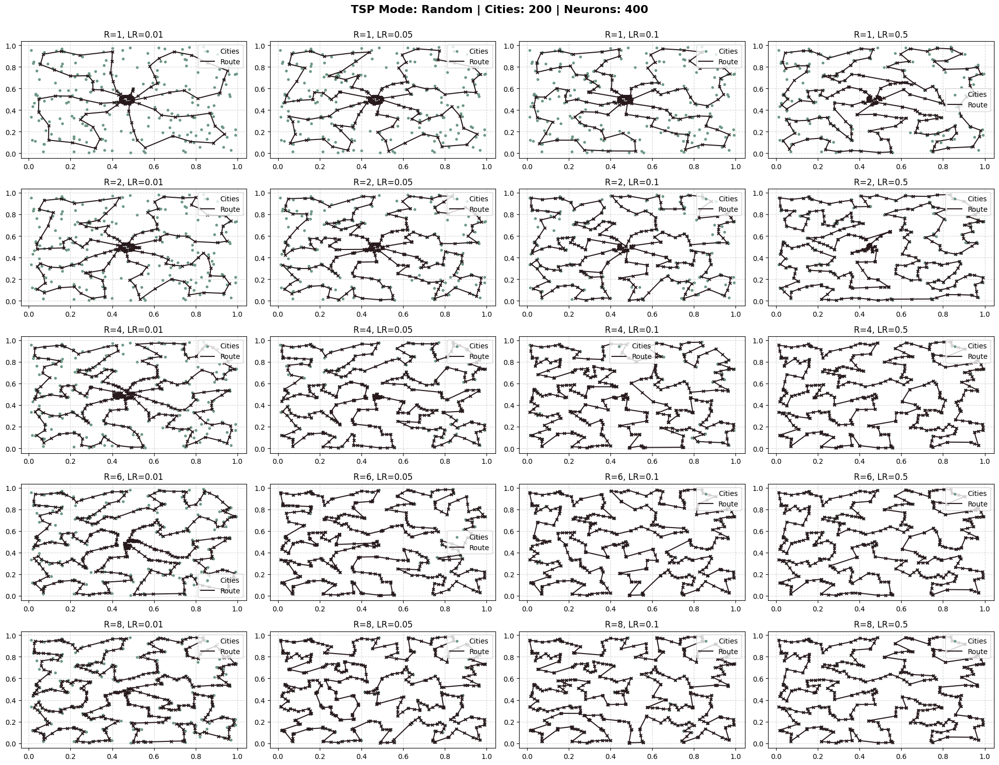

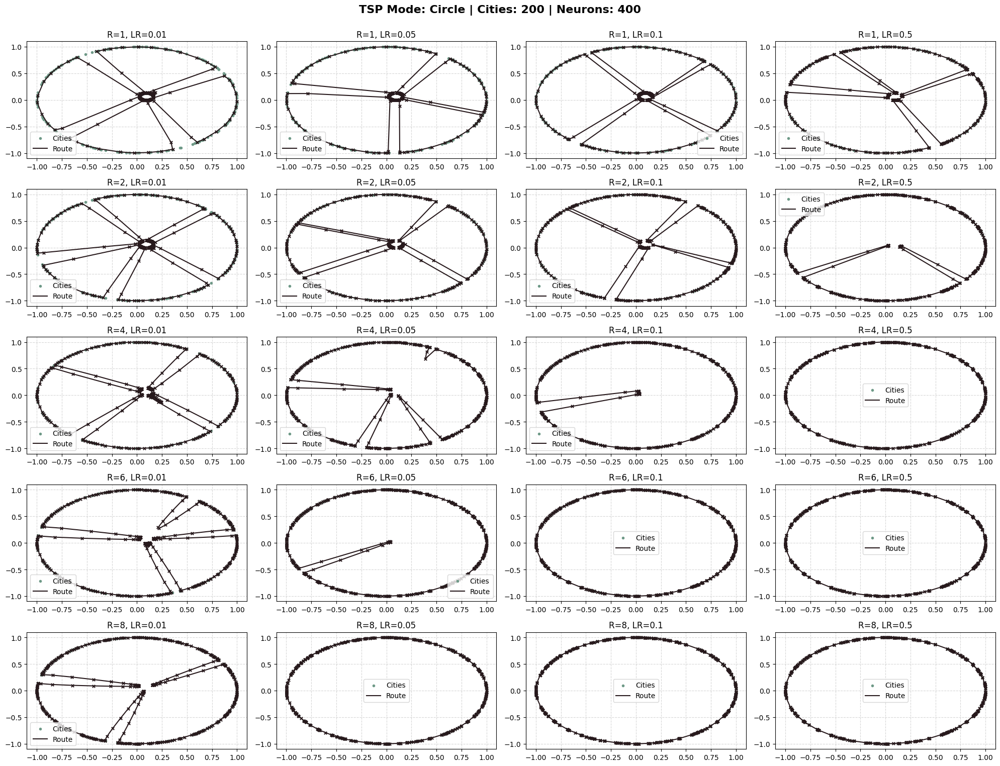

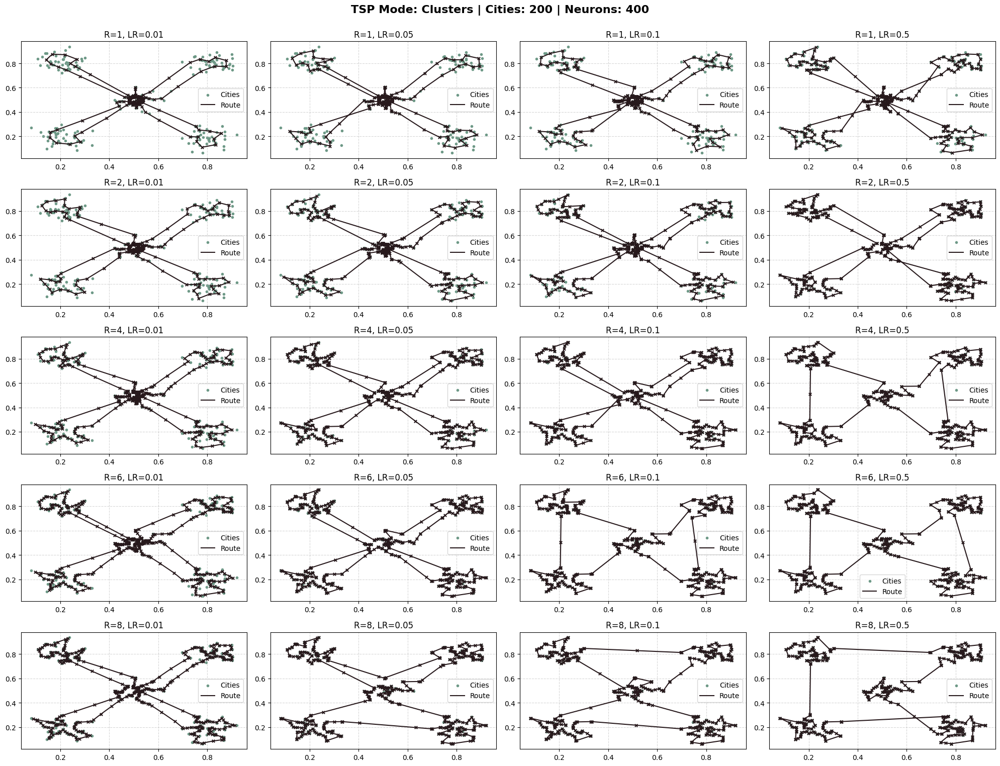

In [37]:
tsp_modes = ['random', 'circle', 'clusters']
radios = [1, 2, 4, 6, 8]    
learning_rates = [0.01, 0.05, 0.1, 0.5]

plot_tsp_loop(tsp_modes, radios, learning_rates, 200, 400, 1000)

&ensp; El análisis de las soluciones generadas para la distribución aleatoria muestra un desempeño general muy satisfactorio. Salvo las configuraciones con radios pequeños $\sigma_0 \leq 2$, (exceptuando el caso de $\eta=0.5$) y aquellas con una tasa de aprendizaje baja $\eta=0.01$, que evidencian falta de iteraciones para converger, el resto logró trazar una ruta casi perfecta con solo algunos deslices menores atribuibles a la falta de *epochs* para un ajuste fino. Es notable que las configuraciones con $\eta=0.5$ convergen consistentemente al mismo resultado óptimo independientemente del radio, visitando la totalidad de las ciudades. En estos casos, dado que la red cuenta con el doble de neuronas que de ciudades, las unidades sobrantes se ubican estratégicamente en las zonas de mayor densidad de datos o en las curvas para suavizar el trayecto. Un fenómeno particular se observa con la combinación de tasa $\eta=0.5$ y radio $\sigma_0 \le 1$: aunque se alcanza una solución óptima en términos de visita, la gran mayoría de las neuronas inactivas permanece concentrada en el centro. Esto se explica porque, al ser la vecindad casi nula, las neuronas ganadoras se desplazan a las ciudades, pero no arrastran a sus vecinas; por ende, las neuronas que no ganan competencias nunca son traccionadas hacia afuera y quedan estancadas en su posición de inicialización, a diferencia de lo que ocurre con radios mayores donde la fuerza de vecinos distribuye toda la red homogéneamente.

&ensp; Por su parte, el análisis del patrón circular refuerza la importancia de los hiperparámetros en la velocidad de adaptación. Las configuraciones con $\eta=0.01$ se mantienen lejos de la solución requerida, indicando una clara necesidad de más iteraciones. Del mismo modo, a los radios de $1$ y $2$ les falta tiempo de entrenamiento para terminar de acomodar la topología al perímetro. Sin embargo, a partir de un radio de $\sigma_0 = 4$, la red de Kohonen demuestra una adaptación notable, aunque algunas configuraciones presentan errores puntuales en un par de muestras, fácilmente corregibles extendiendo el entrenamiento, la forma general es correcta. El desempeño alcanza su punto máximo con radios de $\sigma_0 = 8$, donde todas las ejecuciones, independientemente del $\eta$, logran dibujar un camino circular perfecto sin cruces ni atajos.

&ensp; Finalmente, para la distribución por *clusters*, es fundamental distinguir entre hallar un camino correcto, que visita todos los nodos, y uno eficiente, que minimiza la distancia de tránsito. Las configuraciones de radio bajo ($\sigma_0\leq2$) o tasas de entrenamiento de $\eta=0.01$ resultan ineficaces o subóptimas, como en los casos anteriores. Sin embargo, se destaca un comportamiento interesante en las configuraciones de radio $\sigma_0=\{4, 6, 8 \}$ con $\eta$ de $0.1$ o $0.5$, ya que, estas logran una optimización topológica superior, realizando una única pasada por el centro y comunicando los *clusters* más alejados directamente a través de sus bordes, evitando el constante retorno al centro. En contraste, configuraciones con radios menores, como $\sigma_0=\{ 2, ~4, ~6\}$, tienden a dejar una mayor cantidad de neuronas en el centro para actuar como puentes constantes entre grupos, generando una ruta que, si bien visita todas las ciudades, es menos eficiente en términos de distancia total recorrida al cruzar repetidamente el mapa.

---

<div style="text-align: left;"><h3><b>Base teórica - <i>Unified Distance Matrix</i></b></h3>

<div style="text-align: left;"><h4><b>Definición</b></h4></div>

&ensp; Una de las propiedades fundamentales de las Redes de Kohonen es su capacidad para proyectar datos desde un espacio de entrada $\mathbb{R}^n$ de alta dimensión hacia uno de menor dimensión (generalmente $\mathbb{R}^2$), preservando la topología. Sin embargo, la estructura de rejilla regular de la capa de salida no refleja explícitamente las distancias reales entre los vectores de pesos en el espacio original. Para revelar la estructura de agrupamiento subyacente, llamada *clustering*, y las relaciones métricas locales, se utiliza la Matriz de distancias unificadas o *U-Matrix* (del inglés *Unified Distance Matrix*).  

&ensp; Esta matriz es una representación que visualiza las distancias locales entre las neuronas del mapa. Su propósito es identificar la estructura topológica de los datos, permitiendo distinguir regiones de alta densidad (donde las neuronas están próximas en $\mathbb{R}^n$) de regiones de baja densidad o discontinuidades.

&ensp; Una vez entendida la noción de la *U-Matrix*, se puede definir matemáticamente. Siendo $W$ el conjunto de vectores de pesos del mapa entrenado, donde cada neurona $i$ tiene asociado un vector $\mathbf{w}_i \in \mathbb{R}^n$, y siendo $N(i)$ el conjunto de neuronas vecinas inmediatas a la neurona $i$ en la topología de la rejilla. El valor $U_i$ de la U-Matrix para la neurona $i$ se define como el promedio de las distancias entre su vector de pesos y los de sus vecinos directos:

$$U_i = \frac{1}{|N(i)|} \sum_{j \in N(i)} d(\mathbf{w}_i, \mathbf{w}_j)$$

Donde $d(\cdot, \cdot)$ es una métrica de distancia en el espacio de entrada, típicamente la distancia Euclidiana $\|\mathbf{w}_i - \mathbf{w}_j\|$. Alternativamente, algunas definiciones utilizan la mediana o el máximo de estas distancias, aunque el promedio es la formulación más extendida.

&ensp;

<div style="text-align: left;"><h4><b>Interpretación</b></h4></div>

La visualización de la U-Matrix se interpreta frecuentemente de la siguiente forma:

1. **Clusters:** Los valores bajos de $U_i$ indican que la neurona $i$ y sus vecinas poseen vectores de pesos muy similares. Esto implica que la red se ha desplegado sobre una región del espacio de entrada con alta densidad de probabilidad. Topológicamente, estas áreas representan *clusters* o clases naturales dentro de los datos.

2. **Fronteras:** Los valores altos de $U_i$ señalan una gran distancia métrica entre neuronas topológicamente adyacentes. Esto ocurre cuando la red interpolada cruza regiones del espacio de entrada donde la densidad de datos es nula o muy baja. Estas actúan como fronteras de decisión no lineales, separando los distintos *clusters*.  

---

<div style="text-align: left;">
  <h4><b>Ejercicio 3</b></h4>
</div>

**En el campus encontrará el archivo $\texttt{datos\_para\_clustering.mat}$ que contiene una matriz de datos de $500$ mediciones de una variable de $100$ dimensiones.**

**(A). Utilice una red de Kohonen para reducir la dimensionalidad de los datos.**

**(B). Verifique la presencia de *clusters*, e indique cuantos puede visualizar, haciendo uso de la matriz $\textbf{U}$.**

&ensp;

&ensp; Para el análisis de *clustering* en alta dimensionalidad, se trabaja con el conjunto de datos proporcionado en el archivo $\texttt{datos\_para\_clustering.mat}$. Este *dataset* constituye una matriz de $500$ observaciones, donde cada muestra es un vector perteneciente a un espacio de $100$ dimensiones $\mathbf{x} \in \mathbb{R}^{100}$.

&ensp; La carga de la información se realiza utilizando la función $\texttt{loadmat}$ de la librería $\texttt{SciPy}$, la cual permite extraer las estructuras de datos de $\texttt{MATLAB}$, confirmándose mediante un *print* en la terminal que la dimensión de los datos es consistente. Dado que la Red de Kohonen se basa en la competencia mediante distancias Euclidianas, es crítico que todas las dimensiones contribuyan equitativamente al cálculo del error. Por consiguiente, se aplica una etapa de preprocesamiento consistente en una normalización característica por característica, como se puede visualizar a continuación.

$$x'_{i,j} = \frac{x_{i,j} - \min(\mathbf{x}_j)}{\max(\mathbf{x}_j) - \min(\mathbf{x}_j) + \epsilon}$$

Esto reescala todos los valores al intervalo $[0, 1]$, garantizando que la varianza natural de una dimensión no domine sobre las demás por cuestiones de magnitud, y se añade un término $\epsilon = 10^{-12}$ en el denominador para asegurar la estabilidad numérica.

In [38]:
from scipy.io import loadmat

path = 'Data/datos_para_clustering.mat'
data = loadmat(path)
valid_names = [key for key in data.keys() if not key.startswith('__')][0]

data = data[valid_names]
data_norm = (data - data.min(axis=0)) / (data.max(axis=0) - data.min(axis=0) + 1e-12) 

display(HTML(f"<b>Data shape: {data_norm.shape}</b>"))

&ensp; Una vez cargado el conjunto de datos a utilizar para el entrenamiento, se vuelve a usar la clase $\texttt{GridKohonenNetwork}$ desarrollada en el primer ejercicio. La representación visual de los resultados se gestiona mediante las funciones auxiliares $\texttt{plot\_umatrix}$ y $\texttt{plot\_umatrix\_loop}$, que se encargan únicamente de generar los mapas de calor individuales y de organizar la experimentación iterativa sobre los distintos hiperparámetros, respectivamente.

&ensp; En esta clase, se implementa el método $\texttt{unified\_distance\_matrix}$, que realiza el cálculo de la Matriz U utilizando una estrategia vectorizada para evitar el costo computacional de los bucles iterativos. El algoritmo opera en tres pasos:

1. **Cálculo de distancias:** Computa simultáneamente las normas Euclidianas entre todas las filas adyacentes (`diff_v`) y todas las columnas adyacentes (`diff_h`) de la matriz de pesos.

2. **Acumulación:** Suma estas distancias a las neuronas correspondientes en la matriz llamada `u_matrix`. Cada distancia calculada entre dos neuronas contribuye al valor acumulado de ambas. Paralelamente, se registran la cantidad de vecinos considerados para cada nodo (que varía entre $2$, $3$ o $4$ dependiendo de si la neurona está en una esquina, borde o centro).

3. **Promedio:** Finalmente, divide la matriz acumulada por la matriz de conteos, obteniendo así la distancia promedio exacta de cada neurona con su vecindad inmediata.

In [39]:
def plot_umatrix(ax, kohonen_network, title="U-Matrix") -> None:
    """
    Plots the U-Matrix of the Kohonen network.
    """
    u_matrix = kohonen_network.unified_distance_matrix()
    
    im = ax.imshow(u_matrix, cmap='viridis', origin='lower', zorder=1)
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label='Mean Distance to Neighbors')

    ax.set_title(title)
    ax.grid(True, linestyle='--', alpha=0.5, zorder=0)

def plot_umatrix_loop(radios, learning_rates, network_sizes) -> None:
    """
    Plots U-Matrix for various configurations.
    """
    for size in network_sizes:
        fig, axes = plt.subplots(len(radios), len(learning_rates), figsize=(16, 10))
        fig.suptitle(f"U-Matrix | Network Size: {size}", fontsize=16, fontweight='bold')
        
        for i, r in enumerate(radios):
            for j, lr in enumerate(learning_rates):
                KN = GridKohonenNetwork(network_size=size)
                KN.train(data_norm, learning_rate=lr, radio=r, max_epochs=1000)
                plot_umatrix(axes[i, j], KN, title=f"R={r}, LR={lr}")
        
        plt.tight_layout(rect=[0, 0.03, 1, 0.98])
        plt.show()

&ensp; Definidas las herramientas de cálculo y visualización, se establece el diseño experimental para la detección de clusters. Se evalúan arquitecturas de distintos tamaños ($5 \times 5$, $10 \times 10$ y $20 \times 20$) sometidas a variaciones en el radio de vecindad inicial y la tasa de aprendizaje. El proceso de entrenamiento para cada configuración se extiende por $1000$ epochs, permitiendo la estabilización de los pesos antes de la generación de los mapas de calor resultantes.

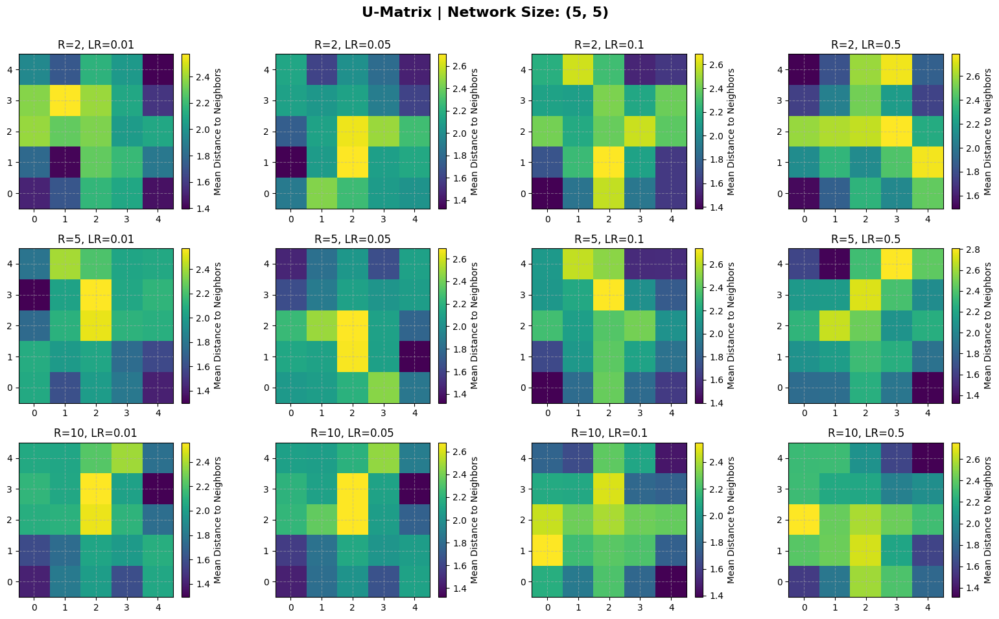

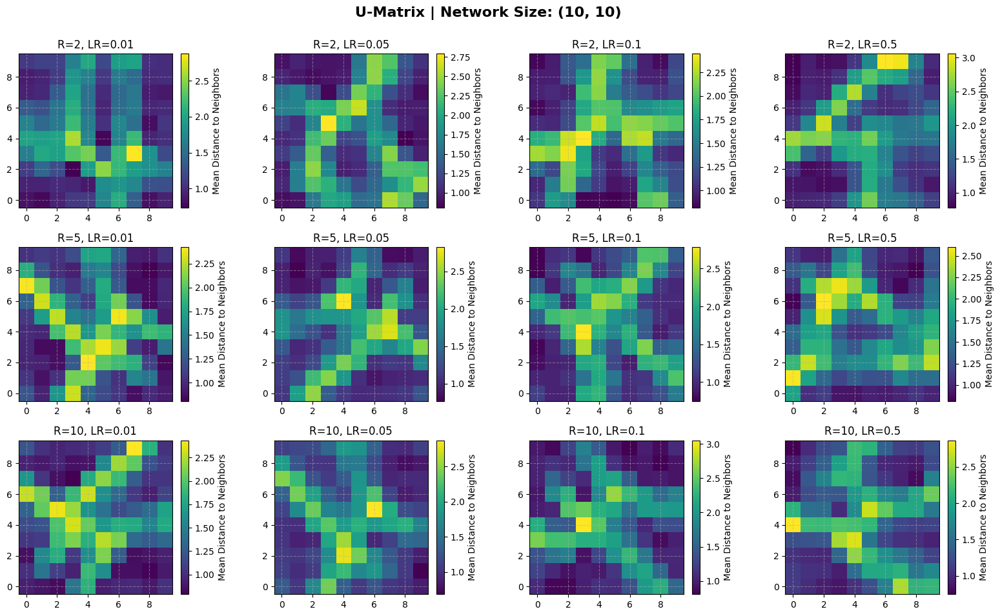

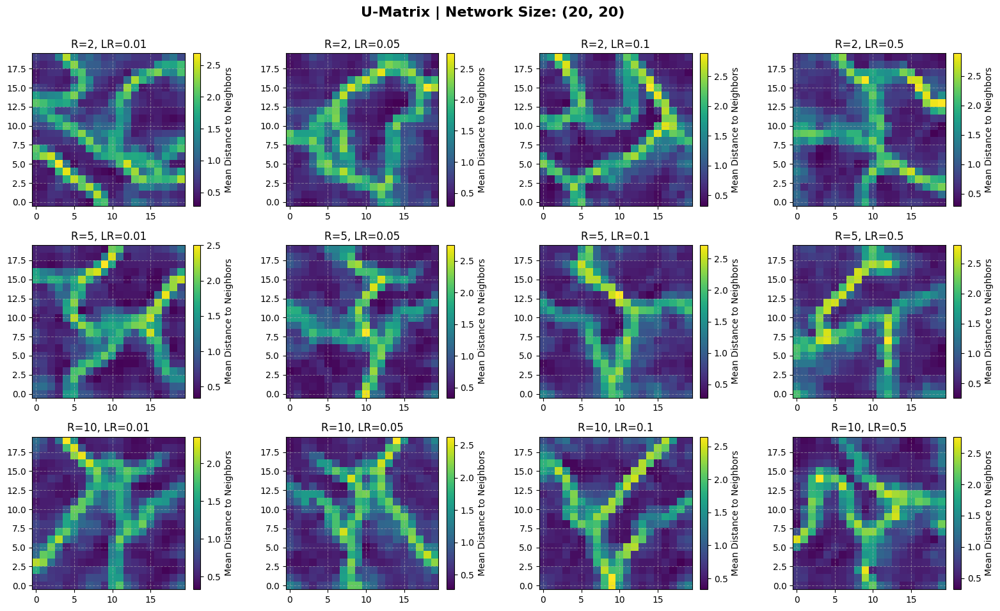

In [40]:
network_sizes = [(5, 5), (10, 10), (20, 20)]
radios = [2, 5, 10]       
learning_rates = [0.01, 0.05, 0.1, 0.5] 

plot_umatrix_loop(radios, learning_rates, network_sizes)

&ensp; El análisis visual de la Matriz U revela una fuerte dependencia entre la resolución de la rejilla y la capacidad de dreconocimiento de estructuras. En el caso de la red de $5\times5$, la cantidad de neuronas resulta insuficiente para modelar la topología compleja del espacio de $100$ dimensiones. Debido a esta baja resolución, los *clusters* no logran definirse, es decir, la red actúa como un estimador demasiado pobre, donde cada neurona debe representar una porción tan grande y heterogénea del espacio de entrada que los promedios de distancia pierden significado estadístico. 

&ensp; Al incrementar el tamaño a $10\times10$, comienzan a verse estructuras identificables, permitiendo visualizar $4$ agrupamientos principales. Sin embargo, la resolución espacial sigue siendo un factor limitante; es probable que existan *clusters* de menor densidad o subestructuras que, debido a la granularidad de la rejilla, queden enmascarados y no logren diferenciarse. Además, se observa que con los distintos radios en esta resolución, no hay cambios notables entre mapas de calor.

&ensp; Finalmente, la arquitectura de $20\times20$ ofrece la resolución necesaria para un análisis detallado. Con una configuración equilibrada $\sigma_0=2$, se logra la mayor nitidez, revelando la existencia de aproximadamente $5$ *clusters* bien definidos separados por fronteras claras. No obstante, se presenta una reducción en la capacidad de discriminación al utilizar parámetros más agresivos, ya sea una tasa de aprendizaje $\eta= \{ 0.1, 0.5 \}$ y radios elevados ($\sigma_0 = 5$ o $10$), donde el conteo aparente desciende a $4$ *clusters*. En el caso de los radios grandes, esto ocurre porque la vecindad amplia fuerza a que la actualización de pesos afecte a regiones extensas del mapa simultáneamente. Al obligar a grupos de neuronas distantes a responder ante los mismos estímulos, se diluyen las fronteras naturales entre clases cercanas, provocando que *clusters* distintos terminen fusionándose y siendo representados como una única clase en la Matriz U.

---
---

<div style="text-align: left;">
  <h3><b>Conclusiones</b></h3>
</div>


&ensp; A lo largo del trabajo se exploraron distintos aspectos de las Redes de Kohonen, tanto desde su formulación teórica como a través de simulaciones computacionales aplicadas a diversos problemas. De esta forma, se logró obtener una visión integral de su funcionamiento, reconociendo a la vez su versatilidad para la visualización de datos complejos y la importancia crítica de la selección de hiperparámetros.

&ensp; En el caso del aprendizaje de figuras geométricas, se verificó que la red converge eficazmente hacia la distribución objetivo, preservando la topología del espacio de entrada incluso con un número limitado de iteraciones. Se observó que arquitecturas demasiado pequeñas pierden resolución y tienden a representar de forma pobre la estructura global, mientras que arquitecturas excesivamente grandes requieren un tiempo de entrenamiento considerable para no tener solapamiento. En este sentido, la configuración intermedia de tamaño $10 \times 10$ resultó ser la más equilibrada, capturando con claridad la forma de los datos. Sin embargo, también se visualizó un efecto propio de los SOM que es la dificultad para cubrir exactamente los bordes de las figuras, producto de la ausencia de muestras fuera de ellas y de la atracción interna ejercida por la vecindad.

&ensp; Respecto del *Travelling Salesman Problem*, la adaptación del modelo a una topología unidimensional de anillo se mostró esencial para obtener rutas que pasen por todas las ciudades. Los experimentos demostraron que, con parámetros adecuados, la red es capaz de generar trayectorias prácticamente óptimas incluso en distribuciones complejas. Las configuraciones con radios demasiado pequeños o tasas de aprendizaje muy bajas evidenciaron falta de convergencia y una tendencia a dejar neuronas inactivas en el centro. Además, las pruebas en distribuciones con *clusters* revelaron que la red puede capturar estructuras globales y conectar regiones separadas de manera eficiente, sin necesidad de pasar por el centro. Esto se dió principalmente cuando el radio de vecindad inicial es de $\sigma_0 = 8$, es decir, grande.

&ensp; En cuanto al análisis del *clustering* mediante la *U-Matrix*, se verificó la marcada influencia de la resolución de la rejilla sobre la capacidad de detección de estructuras. Redes pequeñas resultaron insuficientes para representar la complejidad del espacio de entrada, mientras que aquellas de resolución intermedia lograron identificar agrupamientos principales aunque sin captar subestructuras de menor densidad. Finalmente, la arquitectura de mayor tamaño permitió visualizar con nitidez la presencia de múltiples clusters bien delimitados, aunque se analizó que tasas de aprendizaje y radios grandes tienden a omitir fronteras y fusionar regiones, cambiando el *clustering* obtenido.

&ensp; En conjunto, el trabajo permitió caracterizar de manera integral el comportamiento de la red de Kohonen. Si bien se confirma su eficacia como herramienta para la reducción de dimensionalidad y la visualización de estructuras complejas, también se evidencian limitaciones vinculadas a la configuración de sus hiperparámetros. La elección del radio de vecindad y de la tasa de aprendizaje resulta crítica para garantizar una convergencia estable en un número determinado de *epochs*, mientras que el tamaño de la red determina tanto la capacidad para representar correctamente distribuciones geométricas como la resolución de los mapas de calor generados.
